In [1]:
import numpy as np
import pandas as pd
import os, time
import pickle, gzip
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
from sklearn import preprocessing as pp
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.metrics import roc_curve, auc, roc_auc_score
from sklearn.metrics import confusion_matrix, classification_report

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
import lightgbm as lgb

In [28]:
current_path = os.getcwd()
file = '\\data\\creditcard.csv'
data = pd.read_csv(current_path + file)
data.head()

dataX = data.copy().drop(['Class'], axis=1)
dataY = data['Class'].copy()

featuresToScale = dataX.columns
sX = pp.StandardScaler(copy=True)
dataX.loc[:,featuresToScale] = sX.fit_transform(dataX[featuresToScale])
X_train, X_test, y_train, y_test = train_test_split(dataX, dataY, test_size=0.33, random_state=42, stratify=dataY)


0         0
1         0
2         0
3         0
4         0
         ..
284802    0
284803    0
284804    0
284805    0
284806    0
Name: Class, Length: 284807, dtype: int64


In [29]:
#X_train.head()
y_train.head()

198687    0
129694    0
204218    0
134361    0
173252    0
Name: Class, dtype: int64

In [10]:
def anomalyScores(originalDf, reducedDf):
    loss = np.sum((np.array(originalDf)-np.array(reducedDF))**2,axis=1)
    loss = pd.Series(data=loss, index=originalDf.index)
    loss = (loss-np.min(loss))/(np.max(loss)-np.min(loss))
    return loss

In [11]:
def plotResults(trueLabels, anomalyScores, returnPreds=False):
    preds = pd.concat([trueLabels, anomalyScores], axis=1)
    preds.columns = ['trueLabels','anomalyScores']
    precision, recall, thresholds = precision_recall_curve(preds['trueLabels'], preds   ['anomalyScore'])
    print("precision: " + precision)
    print("recall: " + recall)
    print("thresholds: " + thresholds)

In [30]:
def scatterPlot(xDF, yDF, algoName):
    tempDF = pd.DataFrame(data=xDF.loc[:,0:1], index=xDF.index)
    tempDF = pd.concat((tempDF,yDF), axis=1, join='inner')
    tempDF.columns = ['First Vector', 'Second Vector', 'Label']
    sns.lmplot(x='First Vector', y='Second Vector', hue='Label', data=tempDF, fit_reg=False)
    ax = plt.gca()
    ax.set_title('Seperation of Observations using' + algoName)

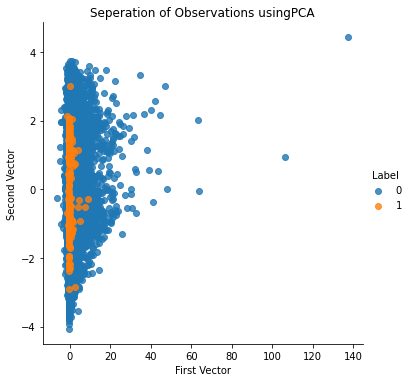

In [31]:
from sklearn.decomposition import PCA

n_components = 30
whiten = False
random_state = 42
pca = PCA(n_components=n_components, whiten=whiten, random_state=random_state)
X_train_PCA = pca.fit_transform(X_train)
X_train_PCA = pd.DataFrame(X_train_PCA)

#X_train_PCA_inverse = pca.inverse_transform(X_train_PCA)
#X_train_PCA_inverse = pd.DataFrame(data=X_train_PCA_inverse)

scatterPlot(X_train_PCA, y_train, "PCA")